# Audio Processing Lab 2: Filter Design and Usage
Gizem Tabak

In [ ]:
#@title Import packages
%matplotlib inline
import scipy.signal as sgn
import scipy.io.wavfile as wv
import matplotlib.pyplot as plt
import numpy as np
import IPython
from matplotlib import mlab as mlab

plt.rcParams["figure.figsize"] = (10, 4)

In [ ]:
#@title Helper functions for generating plots
def plot_fir_response(filter1, nTaps, fs):
    w, h = sgn.freqz(filter1)

    plt.figure()
    plt.subplot(121)
    plt.stem(np.arange(-nTaps//2, nTaps//2), filter1)
    plt.xlabel('Taps')
    plt.ylabel('Amplitude')
    plt.title('FIR impulse response')
    plt.grid()

    ax1 = plt.subplot(122)
    plt.title('FIR frequency response')
    ax1.plot((w/np.pi)*fs/2, 20 * np.log10(abs(h)), 'b')
    ax1.set_ylabel('Amplitude [dB]', color='b')
    ax1.set_xlabel('Frequency [Hz]')
    ax2 = ax1.twinx()
    angles = np.unwrap(np.angle(h))
    ax2.plot((w/np.pi)*fs/2, angles, 'g')
    ax2.set_ylabel('Angle (radians)', color='g')
    ax2.grid()
    ax2.axis('tight')
    plt.show()
    
def compare_filtering(s, s_filt, filt, fs):
    
    if len(filt) == 3:
        p1 = plt.figure()
        plt.subplot(131)
        # s1, f1, t1 = mlab.specgram(s, NFFT=256, Fs=fs, window=np.hanning(256), noverlap=128)
        #s1 = 10*np.log10(s1)
        # plt.pcolormesh(s1, cmap='viridis')
        plt.specgram(s, NFFT=256, Fs=fs, window=np.hanning(256), 
                     noverlap=128, cmap='viridis')
        plt.title('FIR filtered')
        plt.xlabel('Time (sec)')
        plt.ylabel('Freq (Hz)')

        p2 = plt.subplot(132)
        #s2, f2, t2 = mlab.specgram(s_filt, NFFT=256, Fs=fs, window=np.hanning(256), 
        #             noverlap=128)
        #s2 = 10*np.log10(s2)
        
        #plt.pcolormesh(s2, cmap='viridis')
        plt.specgram(s_filt, NFFT=256, Fs=fs, window=np.hanning(256), 
                     noverlap=128, cmap='viridis')
        
        plt.setp(p2.get_yticklabels(), visible=False)
        plt.title('IIR filtered')
        plt.xlabel('Time (sec)')
        # p1.set_clim(min(min(s1), min(s2)), max(max(s1), max(s2)))
        # p2.set_clim(min(min(s1), min(s2)), max(max(s1), max(s2)))
        
        
        w, h = sgn.freqz(filt[0], filt[1])
        w_fir, h_fir = sgn.freqz(filt[2])

        ax1 = plt.subplot(133)
        plt.title('Filter frequency response')
        ax1.plot(20 * np.log10(abs(np.flip(h))), (np.flip(w)/np.pi)*fs/2 , 'b')
        ax1.plot(20 * np.log10(abs(np.flip(h_fir))), (np.flip(w_fir)/np.pi)*fs/2 , 'r')
        ax1.set_xlabel('Amplitude [dB]', color='b')
        plt.setp(ax1.get_yticklabels(), visible=False)
        plt.legend(['IIR', 'FIR'])

        ax2 = ax1.twiny()
        angles = np.unwrap(np.angle(h))
        ax2.plot(np.flip(angles), (np.flip(w)/np.pi)*fs/2, 'g')
        ax2.set_xlabel('Angle (radians)', color='g')
        ax2.grid()
        ax2.axis('tight')
        plt.autoscale(enable=True, axis='y', tight=True)
        
        plt.show()

        print('FIR filtered')
        IPython.display.display( IPython.display.Audio( s, rate=fs))
        print('IIR filtered')
        IPython.display.display( IPython.display.Audio( s_filt, rate=fs))
    else:
        plt.figure()
        plt.subplot(131)
        plt.specgram(s, NFFT=256, Fs=fs, window=np.hanning(256), 
                     noverlap=128, cmap='viridis')
        plt.title('Original')
        plt.xlabel('Time (sec)')
        plt.ylabel('Freq (Hz)')

        ax2 = plt.subplot(132)
        plt.specgram(s_filt, NFFT=256, Fs=fs, window=np.hanning(256), 
                     noverlap=128, cmap='viridis')
        plt.setp(ax2.get_yticklabels(), visible=False)
        plt.title('Filtered')
        plt.xlabel('Time (sec)')

        w, h = sgn.freqz(filt)

        ax1 = plt.subplot(133)
        plt.title('FIR frequency response')
        ax1.plot(20 * np.log10(abs(np.flip(h))), (np.flip(w)/np.pi)*fs/2 , 'b')
        ax1.set_xlabel('Amplitude [dB]', color='b')
        plt.setp(ax1.get_yticklabels(), visible=False)

        ax2 = ax1.twiny()
        angles = np.unwrap(np.angle(h))
        ax2.plot(np.flip(angles), (np.flip(w)/np.pi)*fs/2, 'g')
        ax2.set_xlabel('Angle (radians)', color='g')
        ax2.grid()
        ax2.axis('tight')
        plt.autoscale(enable=True, axis='y', tight=True)


        plt.show()

        print('Before filtering')
        IPython.display.display( IPython.display.Audio( s, rate=fs))
        print('After filtering')
        IPython.display.display( IPython.display.Audio( s_filt, rate=fs))
    
    
    
def plot_iir_response(b, a, fs):
    freq, h = sgn.freqz(b, a, fs=fs)

    ax1 = plt.subplot(111)
    plt.title('IIR filter frequency response')
    ax1.plot(freq, 20 * np.log10(abs(h)), 'b')
    ax1.set_ylabel('Amplitude [dB]', color='b')
    ax1.set_xlabel('Frequency [Hz]')
    ax2 = ax1.twinx()
    angles = np.unwrap(np.angle(h))
    ax2.plot(freq, angles, 'g')
    ax2.set_ylabel('Angle (radians)', color='g')
    ax2.grid()
    ax2.axis('tight')
    plt.show()


## Part 1: When to use which filter?

There are 4 different audio files in this section. Each have a different type of corruption. The goal is to understant the distortions and come up with filters to correct them as best as we can.

### Case 1
Looks like high frequency content is corrupted with noise. We need to apply low pass filter to extract speech signal without the high frequency noise. The speech content ends and noise starts at around 6 kHz. Considering the decay time, I first use a low-pass filter with a cutoff frequency of 4kHz.

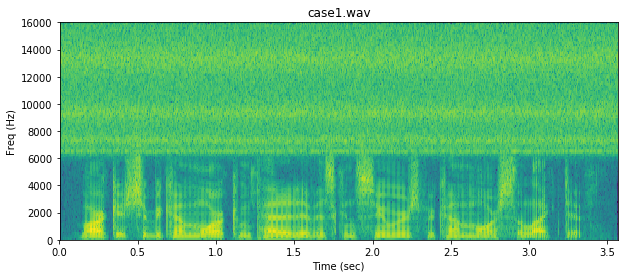

In [ ]:
fs1, case1 = wv.read('case1.wav')

IPython.display.display( IPython.display.Audio( case1, rate=fs1));

plt.figure()
plt.specgram(case1, NFFT=256, Fs=fs1, window=np.hanning(256), 
             noverlap=128, cmap='viridis')
plt.title('case1.wav')
plt.xlabel('Time (sec)')
plt.ylabel('Freq (Hz)')
plt.show()

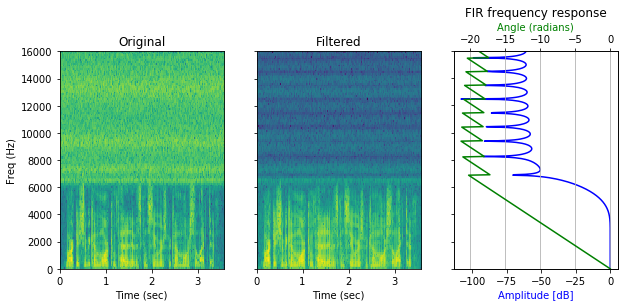

Before filtering


After filtering


In [ ]:
nTaps1 = 31
cutoff1 = 5000
filter1 = sgn.firwin(numtaps=nTaps1, cutoff=cutoff1, fs=fs1)

# plot_fir_response(filter1, nTaps, fs)
case1_filtered = sgn.convolve(case1, filter1)
compare_filtering(case1, case1_filtered, filter1, fs1)

### Case 2

This file sounds like there is a phone ringing on top of someone speaking. In the spectrogram, the ringing is obviously visible in the 2000-2600 Hz range.

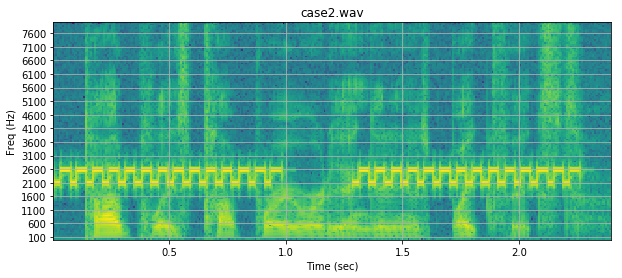

In [ ]:
fs2, case2 = wv.read('case2.wav')

IPython.display.display( IPython.display.Audio( case2, rate=fs2));

plt.figure()
plt.specgram(case2, NFFT=256, Fs=fs2, window=np.hanning(256), 
             noverlap=128, cmap='viridis')
plt.title('case2.wav')
plt.xlabel('Time (sec)')
plt.ylabel('Freq (Hz)')
plt.yticks(np.arange(100, 8100, 500))
plt.grid(which='both')
plt.show()

I used a bandstop filter with cutoff frequencies at 1700 and 3000 Hz. With small number of taps (e.g. 11), the filter response was not sharp enough around the cutoffs and the ringing was still hearable.

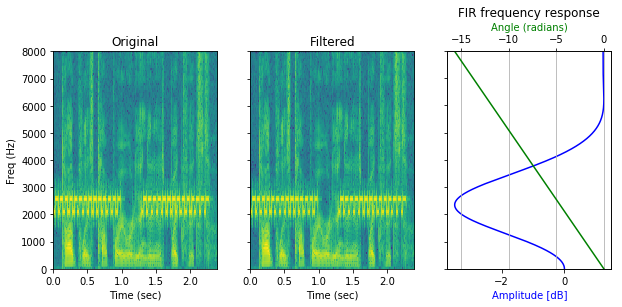

Before filtering


After filtering


In [ ]:
nTaps2 = 11
cutoff2 = [1700, 3000]
filter2 = sgn.firwin(numtaps=nTaps2, cutoff=cutoff2, fs=fs2)

# plot_fir_response(filter2, nTaps2, fs2)
case2_filtered = sgn.convolve(case2, filter2)
compare_filtering(case2, case2_filtered, filter2, fs2)

As I increase the number of taps (e.g. 51), the response became sharper. Although still hearable in the background, the ringing was substantially suppressed. Also, the male voice was a little bit more deeper due to some of higher frequencies in 1700-3000 Hz region being filtered, also.

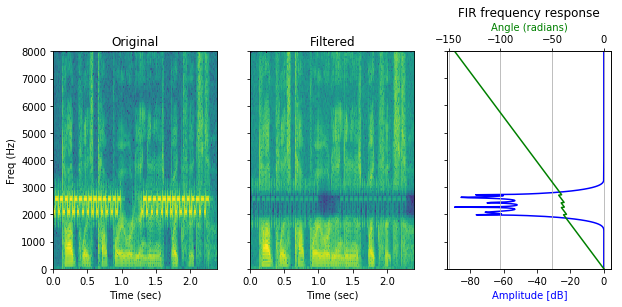

Before filtering


After filtering


In [ ]:
nTaps2 = 101
cutoff2 = [1700, 3000]
filter2 = sgn.firwin(numtaps=nTaps2, cutoff=cutoff2, fs=fs2)

# plot_fir_response(filter2, nTaps2, fs2)
case2_filtered = sgn.convolve(case2, filter2)
compare_filtering(case2, case2_filtered, filter2, fs2)

Then, I tried increasing the bandstop filter bandwidth. While increasing bandwidth clipped out ringing even further, it also made the male voice deeper.

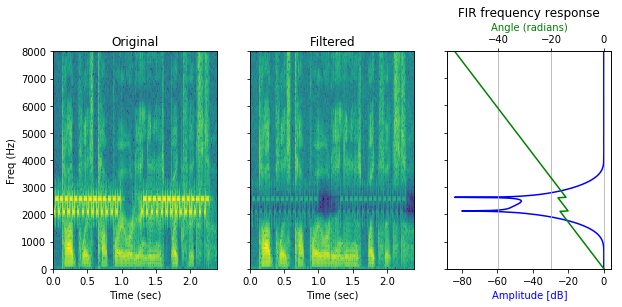

Before filtering


After filtering


In [ ]:
nTaps2 = 41
cutoff2 = [1400, 3300]
filter2 = sgn.firwin(numtaps=nTaps2, cutoff=cutoff2, fs=fs2)
# plot_fir_response(filter2, nTaps2, fs2)
case2_filtered = sgn.convolve(case2, filter2)
compare_filtering(case2, case2_filtered, filter2, fs2)

Finally, I tried windowing on the filters. Some windows such as `Triangular` smoothed the bandstop region and eliminated some of the artifacts. However, that caused more of the signal in that region to pass through the filter (Higher frequency response (dB) value in passband region). Hence, the ringing was clearly audible again.

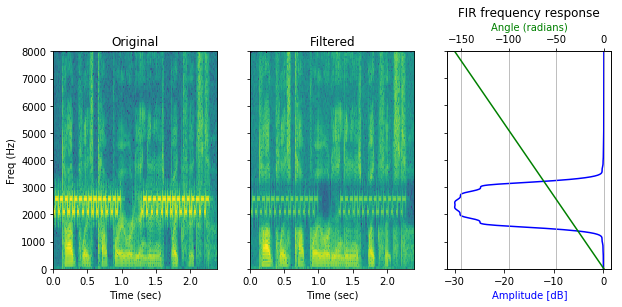

Before filtering


After filtering


In [ ]:
nTaps2 = 101
cutoff2 = [1400, 3300]
filter2 = sgn.firwin(numtaps=nTaps2, cutoff=cutoff2, fs=fs2, window='triang')
# plot_fir_response(filter2, nTaps2, fs2)
case2_filtered = sgn.convolve(case2, filter2)
compare_filtering(case2, case2_filtered, filter2, fs2)


Whereas some other windows, such as `Flattop` made ringing less audible while preserving the speaking voice a little bit better.

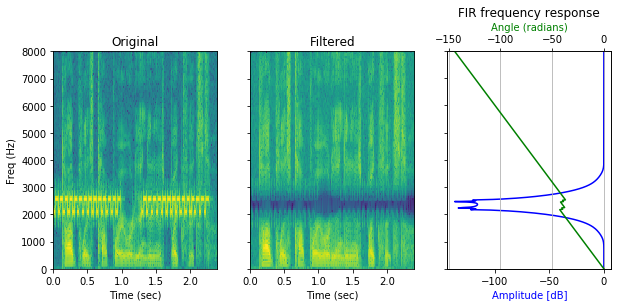

Before filtering


After filtering


In [ ]:
nTaps2 = 101
cutoff2 = [1400, 3300]
filter2 = sgn.firwin(numtaps=nTaps2, cutoff=cutoff2, fs=fs2, window='flattop')
# plot_fir_response(filter2, nTaps2, fs2)
case2_filtered = sgn.convolve(case2, filter2)
compare_filtering(case2, case2_filtered, filter2, fs2)

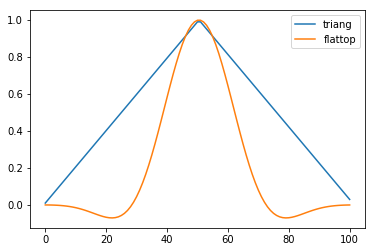

In [ ]:
plt.plot(sgn.get_window('triang', 101))
plt.plot(sgn.get_window('flattop', 101))
plt.legend(['triang','flattop'])
plt.show()

### Case 3

This soundclip contains high frequency bird chirps and low frequency thunder. If we want to isolate high frequency bird chirps, we need to use a high-pass filter. With small number of taps, the cutoff is not sharp enough and the thunderstorm is still audible.

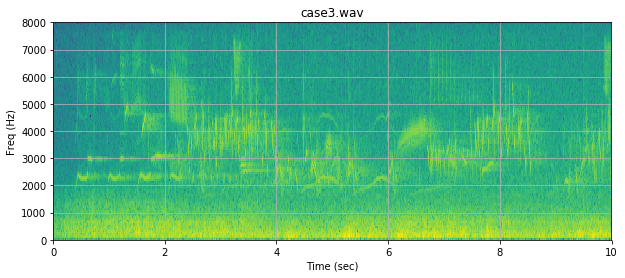

In [ ]:
fs3, case3 = wv.read('case3.wav')

IPython.display.display( IPython.display.Audio( case3, rate=fs3));

plt.figure()
plt.specgram(case3, NFFT=256, Fs=fs3, window=np.hanning(256), 
             noverlap=128, cmap='viridis')
plt.title('case3.wav')
plt.xlabel('Time (sec)')
plt.ylabel('Freq (Hz)')
plt.grid(which='both')
plt.show()

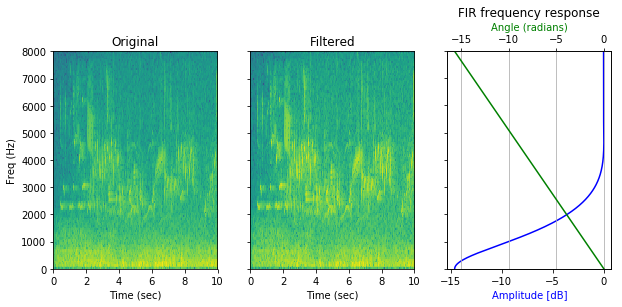

Before filtering


After filtering


In [ ]:
nTaps3 = 11
cutoff3 = 1500
filter3 = sgn.firwin(numtaps=nTaps3, cutoff=cutoff3, fs=fs3, pass_zero=0)

# plot_fir_response(filter3, nTaps, fs3)
case3_filtered = sgn.convolve(case3, filter3)
compare_filtering(case3, case3_filtered, filter3, fs3)

As I increase the number of filter taps, I was able to remove the thunderstorm. In exchange for a steeper slope between passband and stopband, there are sidelobes in the stopband which causes a hissing sound.

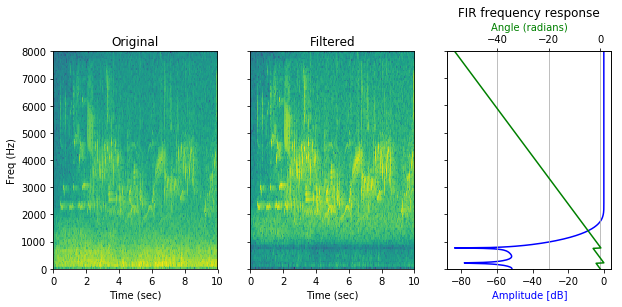

Before filtering


After filtering


In [ ]:
nTaps3 = 41
cutoff3 = 1500
filter3 = sgn.firwin(numtaps=nTaps3, cutoff=cutoff3, fs=fs3, pass_zero=0)

# plot_fir_response(filter3, nTaps, fs3)
case3_filtered = sgn.convolve(case3, filter3)
compare_filtering(case3, case3_filtered, filter3, fs3)

### Case 4

This time, we are only interested in the Morse code with 900 Hz base frequency (and possibly its first harmonic at ~1800 Hz). Hence, I used a bandpass filter to eliminate high and low frequency environmental noise. Since the frequency region of interest is relatively narrow, using smaller number of filter taps does not provide high enough slope between passband and stopband, hence does not successfully suppress noise. 

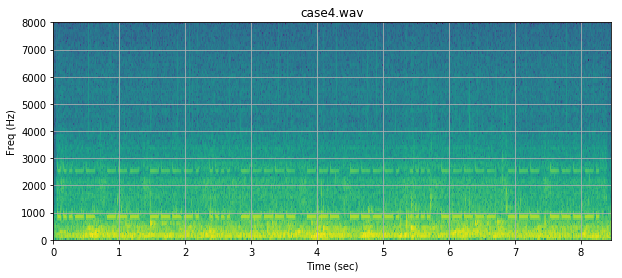

In [ ]:
fs4, case4 = wv.read('case4.wav')

IPython.display.display( IPython.display.Audio( case4, rate=fs4));

plt.figure()
plt.specgram(case4, NFFT=256, Fs=fs4, window=np.hanning(256), 
             noverlap=128, cmap='viridis')
plt.title('case4.wav')
plt.xlabel('Time (sec)')
plt.ylabel('Freq (Hz)')
plt.grid(which='both')
plt.show()

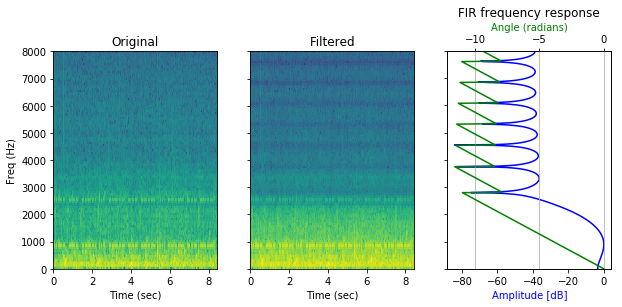

Before filtering


After filtering


In [ ]:
nTaps4 = 21
cutoff4 = [700, 1100]
filter4 = sgn.firwin(numtaps=nTaps4, cutoff=cutoff4, fs=fs4, pass_zero=0)

# plot_fir_response(filter4, nTaps, fs4)
case4_filtered = sgn.convolve(case4, filter4)
compare_filtering(case4, case4_filtered, filter4, fs4)

In order to get a successfull suppression of noise, I needed to increase number of filter taps to 101, and increasing it further to 201 gave much cleaner beep tones. 

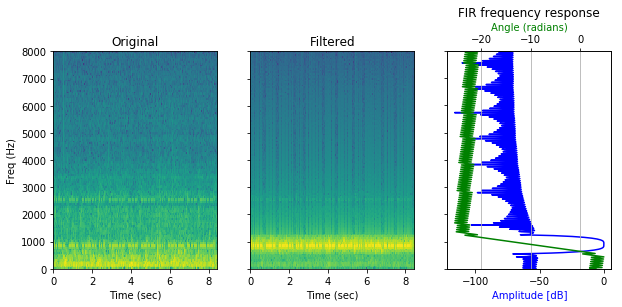

Before filtering


After filtering


In [ ]:
nTaps4 = 201
cutoff4 = [700, 1100]
filter4 = sgn.firwin(numtaps=nTaps4, cutoff=cutoff4, fs=fs4, pass_zero=0, window='hamming')

# plot_fir_response(filter4, nTaps, fs4)
case4_filtered = sgn.convolve(case4, filter4)
compare_filtering(case4, case4_filtered, filter4, fs4)

Then, I tried to utilize the harmonic at ~1800 Hz to make the beep even more audible. For that purpose, I used a filter with 2 passband regions. This resulted in sharper and more realistic beeps.

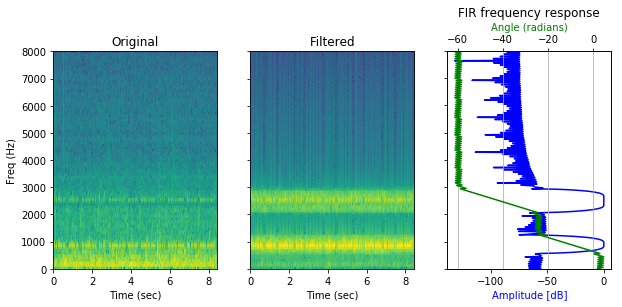

Before filtering


After filtering


In [ ]:
nTaps4_2 = 201
cutoff4_2 = [700, 1100, 2200, 2800]
filter4_2 = sgn.firwin(numtaps=nTaps4_2, cutoff=cutoff4_2, fs=fs4, pass_zero=0)

# plot_fir_response(filter4, nTaps, fs4)
case4_filtered_2 = sgn.convolve(case4, filter4_2)
compare_filtering(case4, case4_filtered_2, filter4_2, fs4)

In the next 2 sections, I'll use various tools to design my own FIR and IIR filters and compare their performance when addressing the distortions.

## Part 2: Filter Design - FIR Filters

### Low-pass Filter
I created a low-pass signal using $x[n] = \omega \text{sinc}(n\omega), n=-N/2, \dots,N/2$ where $N$ is the number of taps - 1. When I compare it to the filter generated by `scipy.signal.firwin`, I realized the edges of the second one was tapered off, meaning it was windowed. So I windowed the filter I generated with Hamming window to obtain the same filter response.

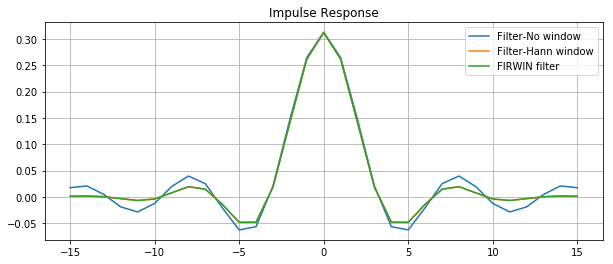

Designed Filter


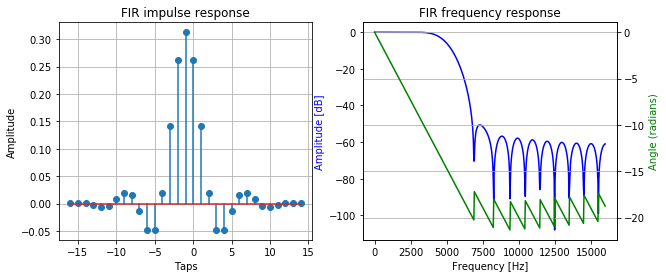

FIRWIN Filter


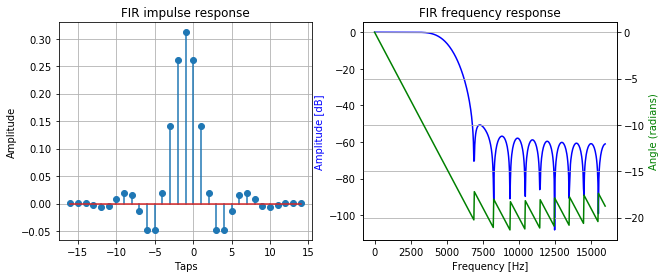

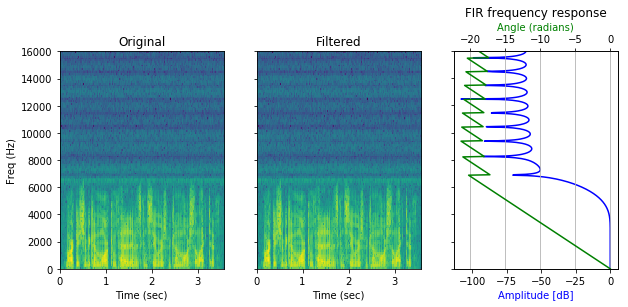

Before filtering


After filtering


In [ ]:
def lowpass(ntaps, cutoff, fs):
    h = np.zeros([ntaps,])
    n = range(-((ntaps - 1)//2), ((ntaps - 1)//2+1))
    for i in n:
        h[i+((ntaps - 1)//2)] = (2 * cutoff/fs)*np.sinc(2 * i * cutoff/fs)
    return h

n = range(-((nTaps1 - 1)//2), ((nTaps1 - 1)//2+1))
filter1 = sgn.firwin(numtaps=nTaps1, cutoff=cutoff1, fs=fs1)
h1 = lowpass(nTaps1, cutoff1, fs1)
window1 = sgn.windows.hamming( nTaps1)
h1_windowed = h1*window1

plt.plot(n, h1)
plt.plot(n, h1_windowed)
plt.plot(n, filter1)
plt.legend(['Filter-No window', 'Filter-Hann window', 'FIRWIN filter'])
plt.title('Impulse Response')
plt.grid()
plt.show()

print('Designed Filter')
plot_fir_response(h1_windowed, nTaps1, fs1)
print('FIRWIN Filter')
plot_fir_response(filter1, nTaps1, fs1)

case1_h1_filtered = sgn.convolve(case1, h1_windowed)

compare_filtering(case1_filtered, case1_h1_filtered, h1_windowed, fs1)



### Bandstop Filter
I used the below formula for the bandstop filter:

$x[n]=2\cos(\pi n \omega_c)\omega_b \text{sinc}(\omega_bn)$ 
where $\omega_c$ is the center frequency and $\omega_b$ is the single-side bandwidth of the filter. Meaning, $\omega_c = \dfrac{\text{cutoff}[0]+\text{cutoff}[1]}{2f_s/2}$ and $\omega_b =  \dfrac{\text{cutoff}[1]-\text{cutoff}[0]}{2f_s/2}$

The, I used `flattop` window again on top of the designed filter to obtain the same response as in previous case.

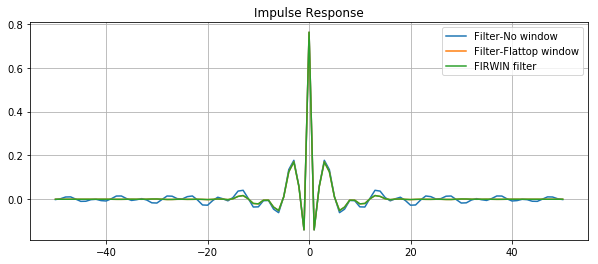

Designed Filter


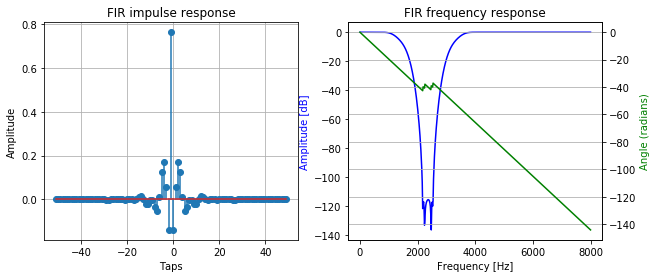

FIRWIN Filter


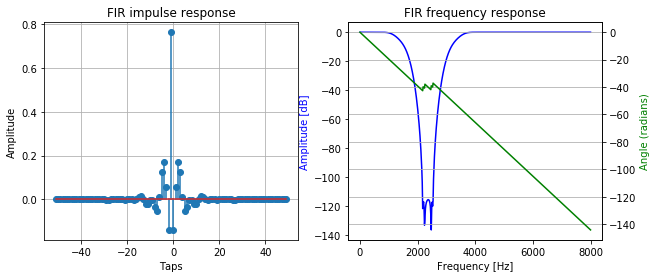

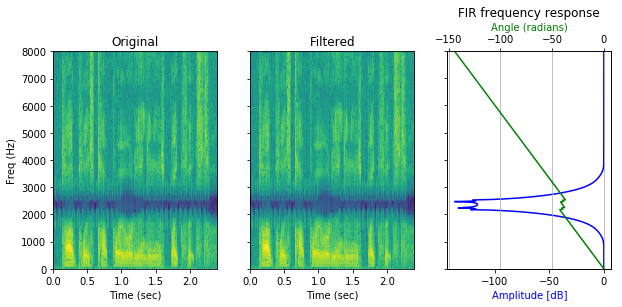

Before filtering


After filtering


In [ ]:
def bandstop(ntaps, cutoff, fs):
    h = np.zeros([ntaps,])
    n = range(-((ntaps - 1)//2), ((ntaps - 1)//2+1))
    cutoff = [c/(fs/2) for c in cutoff]
    for i in n:
        if i == 0:
            h[i+((ntaps - 1)//2)] = 1-(2 * np.cos(np.pi*(i*(cutoff[0] + cutoff[1])/2))*(cutoff[1]-cutoff[0])/2)*np.sinc(i * (cutoff[1]-cutoff[0])/2)
        else:
            h[i+((ntaps - 1)//2)] = -(2 * np.cos(np.pi*(i*(cutoff[0] + cutoff[1])/2))*(cutoff[1]-cutoff[0])/2)*np.sinc(i * (cutoff[1]-cutoff[0])/2)
    return h

n = range(-((nTaps2 - 1)//2), ((nTaps2 - 1)//2+1))
h2 = bandstop(nTaps2, cutoff2, fs2)
window2 = sgn.windows.flattop( nTaps2)
h2_windowed = h2*window2

plt.plot(n, h2)
plt.plot(n, h2_windowed)
plt.plot(n, filter2)
plt.legend(['Filter-No window', 'Filter-Flattop window', 'FIRWIN filter'])
plt.title('Impulse Response')
plt.grid()
plt.show()
print('Designed Filter')
plot_fir_response(h2_windowed, nTaps2, fs2)
print('FIRWIN Filter')
plot_fir_response(filter2, nTaps2, fs2)

case2_h2_filtered = sgn.convolve(case2, h2_windowed)

compare_filtering(case2_filtered, case2_h2_filtered, h2_windowed, fs2)



### High-pass window

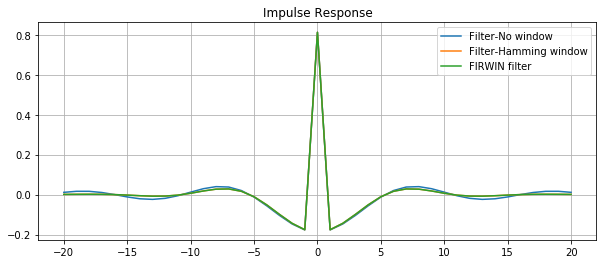

Designed Filter


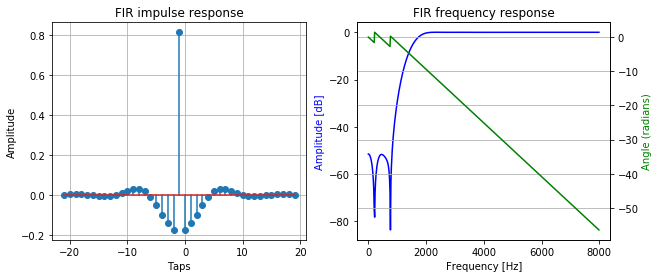

FIRWIN Filter


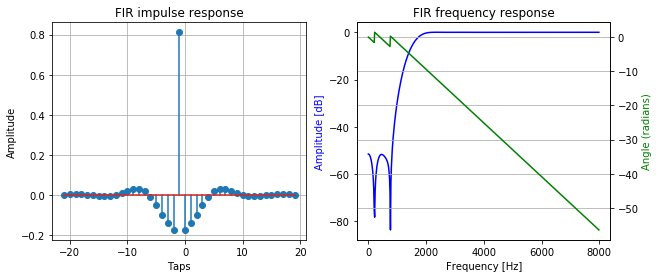

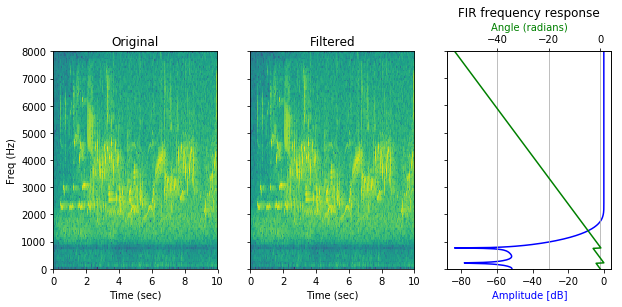

Before filtering


After filtering


In [ ]:
def highpass(ntaps, cutoff, fs):
    h = np.zeros([ntaps,])
    n = range(-((ntaps - 1)//2), ((ntaps - 1)//2+1))
    cutoff = cutoff/(fs/2)
    for i in n:
        if i == 0:
            h[i+((ntaps - 1)//2)] = 1-(cutoff)*np.sinc(i * cutoff)
        else:
            h[i+((ntaps - 1)//2)] = -(cutoff)*np.sinc(i * cutoff)
    return h

n = range(-((nTaps3 - 1)//2), ((nTaps3 - 1)//2+1))
h3 = highpass(nTaps3, cutoff3, fs3)
window3 = sgn.windows.hamming( nTaps3)
h3_windowed = h3*window3

plt.plot(n, h3)
plt.plot(n, h3_windowed)
plt.plot(n, filter3)
plt.legend(['Filter-No window', 'Filter-Hamming window', 'FIRWIN filter'])
plt.title('Impulse Response')
plt.grid()
plt.show()
print('Designed Filter')
plot_fir_response(h3_windowed, nTaps3, fs3)
print('FIRWIN Filter')
plot_fir_response(filter3, nTaps3, fs3)

case3_h3_filtered = sgn.convolve(case3, h3_windowed)

compare_filtering(case3_filtered, case3_h3_filtered, h3_windowed, fs3)



### Bandpass Filter

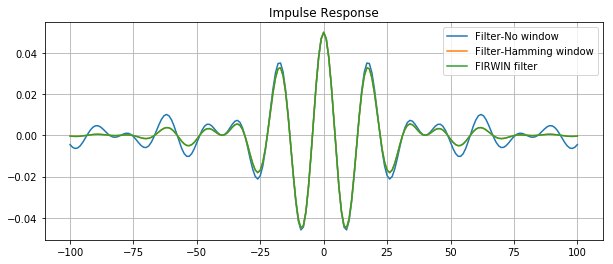

Designed Filter


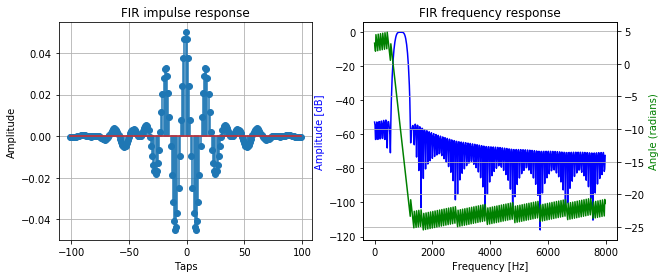

FIRWIN Filter


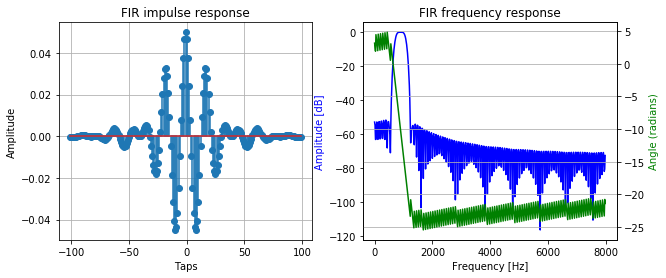

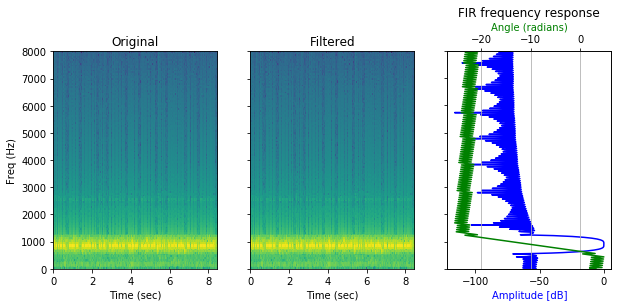

Before filtering


After filtering


In [ ]:
def bandpass(ntaps, cutoff, fs):
    h = np.zeros([ntaps,])
    n = range(-((ntaps - 1)//2), ((ntaps - 1)//2+1))
    cutoff = [c/(fs/2) for c in cutoff]
    for i in n:
            h[i+((ntaps - 1)//2)] = (2 * np.cos(np.pi*(i*(cutoff[0] + cutoff[1])/2))*(cutoff[1]-cutoff[0])/2)*np.sinc(i * (cutoff[1]-cutoff[0])/2)
    return h

n = range(-((nTaps4 - 1)//2), ((nTaps4 - 1)//2+1))
h4 = bandpass(nTaps4, [700, 1100], fs4)
window4 = sgn.windows.hamming( nTaps4)
h4_windowed = h4*window4

plt.plot(n, h4)
plt.plot(n, h4_windowed)
plt.plot(n, filter4)
plt.legend(['Filter-No window', 'Filter-Hamming window', 'FIRWIN filter'])
plt.title('Impulse Response')
plt.grid()
plt.show()
print('Designed Filter')
plot_fir_response(h4_windowed, nTaps4, fs4)
print('FIRWIN Filter')
plot_fir_response(filter4, nTaps4, fs4)

case4_h4_filtered = sgn.convolve(case4, h4_windowed)

compare_filtering(case4_filtered, case4_h4_filtered, h4_windowed, fs4)



### Arbitrary (Bandpass) Filter
In this case, I designed a filter so that it will have 2 passband regions as the second filter in Case 4. For that purpose, first I created the filter in frequency domain. Then, I converted it to time domain to get the impulse response of the filter, and windowed it to taper out the edges and to reduce the ripple effect in frequency domain.

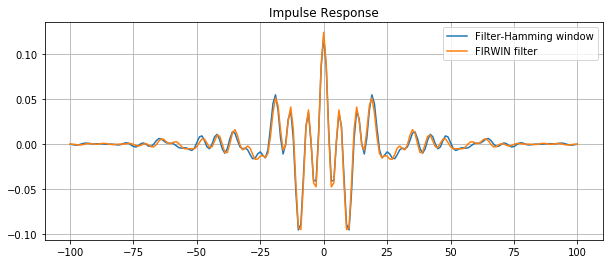

Designed Filter


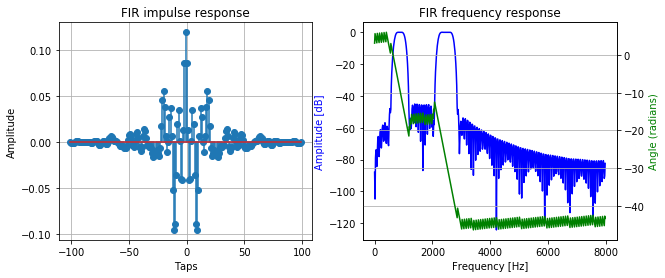

FIRWIN Filter


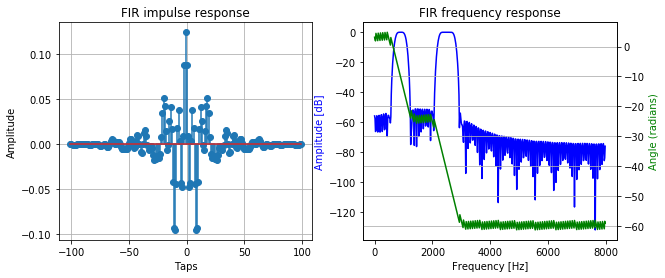

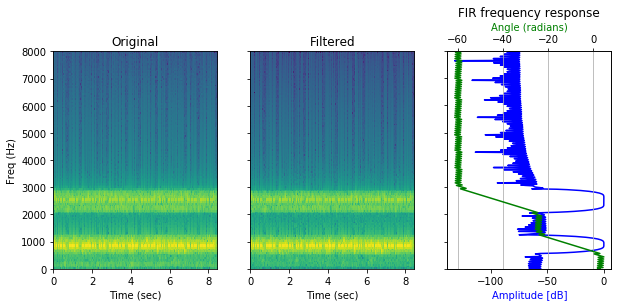

Before filtering


After filtering


In [ ]:
def arbitrary_filter(ntaps, cutoff, fs):
    f_h = np.zeros([ntaps//2+1,])
    cutoff = [c/(fs/2) for c in cutoff]
    for i in range(len(cutoff)//2):
        f_h[round(cutoff[2*i]*(ntaps//2+1)):round(cutoff[2*i+1]*(ntaps//2+1))] = 1
    window = sgn.windows.hamming( ntaps)
    f_h_sym = np.concatenate((f_h, np.flip(f_h[1:])))
    h = np.fft.ifft(f_h_sym)
    h = np.concatenate((h[ntaps//2+1:], h[:ntaps//2+1]))
    h_windowed = h * window
    return np.real(h_windowed) 

n = range(-((nTaps4_2 - 1)//2), ((nTaps4_2 - 1)//2+1))

h4_windowed = arbitrary_filter(nTaps4_2, cutoff4_2, fs4)

plt.plot(n, h4_windowed)
plt.plot(n, filter4_2)
plt.legend(['Filter-Hamming window', 'FIRWIN filter'])
plt.title('Impulse Response')
plt.grid()
plt.show()
print('Designed Filter')
plot_fir_response(h4_windowed, nTaps4_2, fs4)
print('FIRWIN Filter')
plot_fir_response(filter4_2, nTaps4_2, fs4)

case4_h4_filtered = sgn.convolve(case4, h4_windowed)

compare_filtering(case4_filtered_2, case4_h4_filtered, filter4_2, fs4)



## Part 3: Filter Design - IIR Filters

### Low-pass (Case 1)
As it can be seen in the frequency response plot below, IIR filter has sharper slope and does not have as much ripples as the FIR filter outside of the passband range, while having a flat response in the passband range. Hence, using IIR filter in this case decreased the hissing sound significantly while preserving the male voice.

The colorbar limits of two spectrograms are different. Hence, the colors look a little bit different from each other. I could not manage to get them to the same scale, but if they were on the same scale, passband would look almost exactly the same in the two spectrograms, and IIR filtered one would be much more darker in high frequencies.

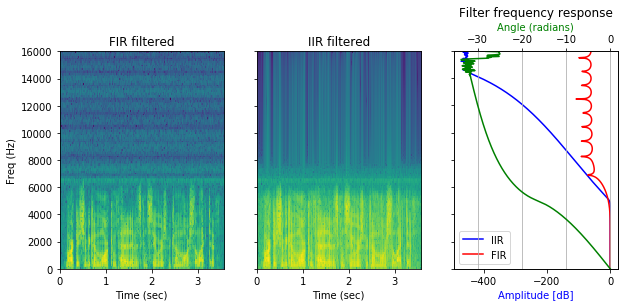

FIR filtered


IIR filtered


In [ ]:
b, a = sgn.iirfilter(21, cutoff1/(fs1/2), btype='lowpass')
case1_iir_filtered = sgn.lfilter(b, a, case1)
compare_filtering(case1_filtered, case1_iir_filtered, [b, a, filter1], fs1)


### Bandstop Filter (Case 2)
In this case, IIR filter has much better suppression with significantly less number of taps. The phone ring is almost inaudible while the male voice is still hearable, although again deeper than original.


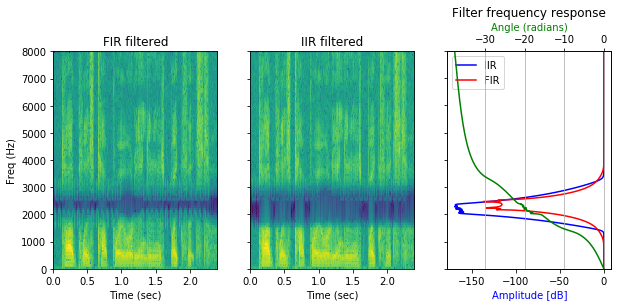

FIR filtered


IIR filtered


In [ ]:
c2 = [c/(fs2/2) for c in cutoff2]
b2, a2 = sgn.iirfilter(11, c2, btype='bandstop')
case2_iir_filtered = sgn.lfilter(b2, a2, case2)
compare_filtering(case2_filtered, case2_iir_filtered, [b2, a2, filter2], fs2)


### Highpass Filter
IIR filter has more flat response in the passband, sharper slope in the transition band and much better suppression in the stopband (also with significantly less number of taps). Hence, with IIR filter, noise is better suppressed while bird chirps are preserved.

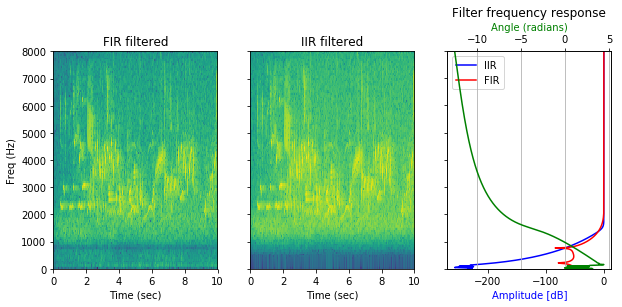

FIR filtered


IIR filtered


In [ ]:
b3, a3 = sgn.iirfilter(11, cutoff3/(fs3/2), btype='highpass')
case3_iir_filtered = sgn.lfilter(b3, a3, case3)
compare_filtering(case3_filtered, case3_iir_filtered, [b3, a3, filter3], fs3)


### Bandpass filter

In this case, IIR filter has slightly less sharp slope in the transition bands with much lower response outside of the passband. Background noise is attenuated compared to FIR filter, again with much less number of taps.

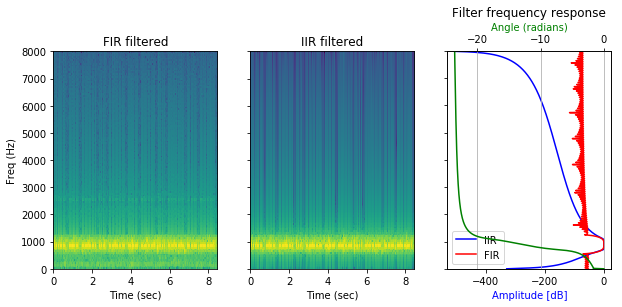

FIR filtered


IIR filtered


In [ ]:
c4 = [c/(fs4/2) for c in cutoff4]
b4, a4 = sgn.iirfilter(7, c4, btype='bandpass')
case4_iir_filtered = sgn.lfilter(b4, a4, case4)
compare_filtering(case4_filtered, case4_iir_filtered, [b4, a4, filter4], fs4)


## Part 4: A Simple Equalizer

I used `firwin2` function to generate an equalizer. To test it, I generated a mixture of sinusoidals with frequencies at the center of the equalizer. When I used a small number of taps in the equalizer (e.g. 51), I could not get the expected gain values aafter equalization, especially for lower frequencies since the slope of the transition band was not sharp enough. So, I increased the number of filter taps (to 201). Then, I obtained much accurate results.

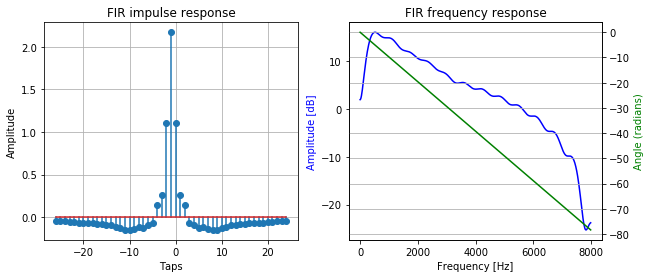

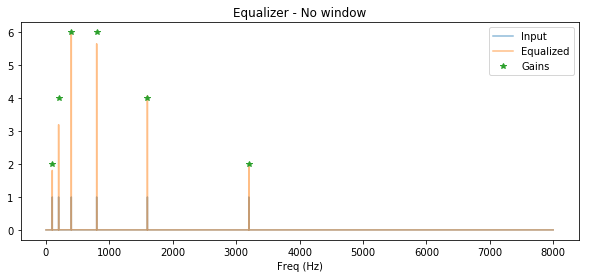

In [ ]:
def equalizer(s, gains):
    numtaps = 51
    freq = [0, 100, 200, 400, 800, 1600, 3200, 8000]
    gains = [0]+gains
    gains = gains+[0]
    eq = sgn.firwin2(numtaps, freq, gains, nyq = 8000, window=None)
    s_eq = sgn.convolve(s, eq, mode='same')
    return s_eq, eq

fs = 16000
t = np.arange(0, 2, 1/fs)
freq = [100, 200, 400, 800, 1600, 3200]
gains = [2, 4, 6, 6, 4, 2]
s = np.zeros(len(t))
for f in freq:
    s += np.sin(2*np.pi*f*t)

s_eq, eq = equalizer(s, gains)

plot_fir_response(eq, len(eq), fs)

fft_s = abs(np.fft.rfft(s))/(len(s)/2)
fft_s_eq = abs(np.fft.rfft(s_eq))/(len(s_eq)/2)
f = np.arange(0, len(fft_s))*(fs/(2*len(fft_s)))

plt.plot(f, fft_s, alpha=0.5)
plt.plot(f, fft_s_eq, alpha=0.5)
plt.plot(freq, gains, '*')
plt.legend(['Input', 'Equalized', 'Gains'])
plt.title('Equalizer - No window')
plt.xlabel('Freq (Hz)')
plt.show()

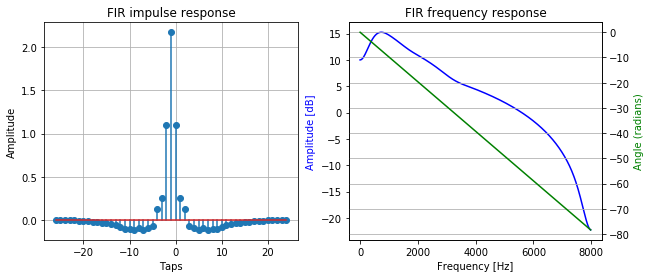

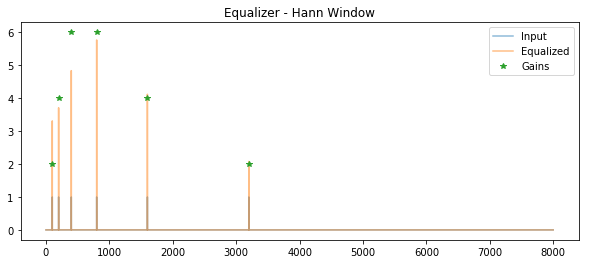

In [ ]:
def equalizer(s, gains):
    numtaps = 51
    freq = [0, 100, 200, 400, 800, 1600, 3200, 8000]
    gains = [0]+gains
    gains = gains+[0]
    eq = sgn.firwin2(numtaps, freq, gains, nyq = 8000, window='hann')
    s_eq = sgn.convolve(s, eq, mode='same')
    return s_eq, eq

fs = 16000
t = np.arange(0, 2, 1/fs)
freq = [100, 200, 400, 800, 1600, 3200]
gains = [2, 4, 6, 6, 4, 2]
s = np.zeros(len(t))
for f in freq:
    s += np.sin(2*np.pi*f*t)

s_eq, eq = equalizer(s, gains)

plot_fir_response(eq, len(eq), fs)

fft_s = abs(np.fft.rfft(s))/(len(s)/2)
fft_s_eq = abs(np.fft.rfft(s_eq))/(len(s_eq)/2)
f = np.arange(0, len(fft_s))*(fs/(2*len(fft_s)))

plt.plot(f, fft_s, alpha=0.5)
plt.plot(f, fft_s_eq, alpha=0.5)
plt.plot(freq, gains, '*')
plt.title('Equalizer - Hann Window')
plt.legend(['Input', 'Equalized', 'Gains'])
plt.show()

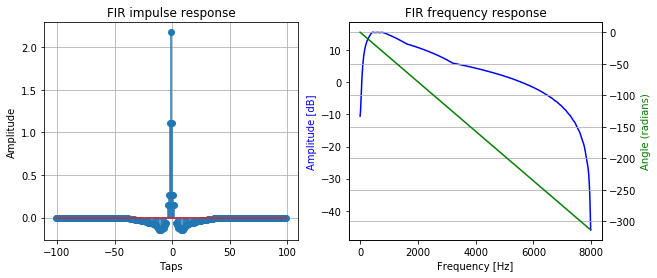

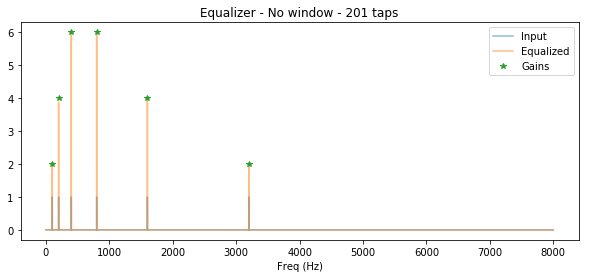

In [ ]:
def equalizer(s, gains):
    numtaps = 201
    freq = [0, 100, 200, 400, 800, 1600, 3200, 8000]
    gains = [0]+gains
    gains = gains+[0]
    eq = sgn.firwin2(numtaps, freq, gains, nyq = 8000, window=None)
    s_eq = sgn.convolve(s, eq, mode='same')
    return s_eq, eq

fs = 16000
t = np.arange(0, 2, 1/fs)
freq = [100, 200, 400, 800, 1600, 3200]
gains = [2, 4, 6, 6, 4, 2]
s = np.zeros(len(t))
for f in freq:
    s += np.sin(2*np.pi*f*t)

s_eq, eq = equalizer(s, gains)

plot_fir_response(eq, len(eq), fs)

fft_s = abs(np.fft.rfft(s))/(len(s)/2)
fft_s_eq = abs(np.fft.rfft(s_eq))/(len(s_eq)/2)
f = np.arange(0, len(fft_s))*(fs/(2*len(fft_s)))

plt.plot(f, fft_s, alpha=0.5)
plt.plot(f, fft_s_eq, alpha=0.5)
plt.plot(freq, gains, '*')
plt.legend(['Input', 'Equalized', 'Gains'])
plt.title('Equalizer - No window - 201 taps')
plt.xlabel('Freq (Hz)')
plt.show()

As I make the gains at the lower frequencies less uniform, it becomes harder to obtain a better matching gains in the output. However, it seems easier to match nonuniform gains at higher frequencies.

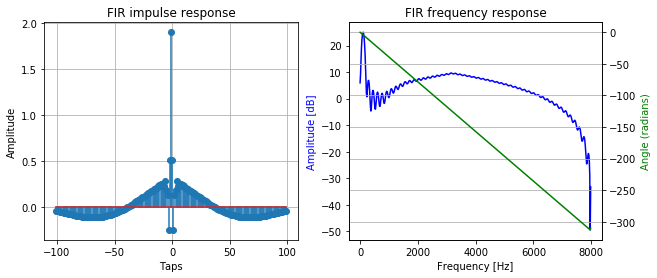

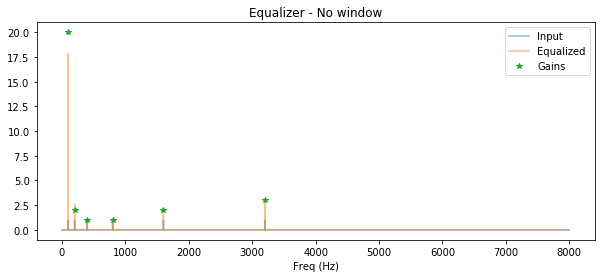

In [ ]:
def equalizer(s, gains):
    numtaps = 201
    freq = [0, 100, 200, 400, 800, 1600, 3200, 8000]
    gains = [0]+gains
    gains = gains+[0]
    eq = sgn.firwin2(numtaps, freq, gains, nyq = 8000, window=None)
    s_eq = sgn.convolve(s, eq, mode='same')
    return s_eq, eq

fs = 16000
t = np.arange(0, 2, 1/fs)
freq = [100, 200, 400, 800, 1600, 3200]
gains = [20, 2, 1, 1, 2, 3]
s = np.zeros(len(t))
for f in freq:
    s += np.sin(2*np.pi*f*t)

s_eq, eq = equalizer(s, gains)

plot_fir_response(eq, len(eq), fs)

fft_s = abs(np.fft.rfft(s))/(len(s)/2)
fft_s_eq = abs(np.fft.rfft(s_eq))/(len(s_eq)/2)
f = np.arange(0, len(fft_s))*(fs/(2*len(fft_s)))

plt.plot(f, fft_s, alpha=0.5)
plt.plot(f, fft_s_eq, alpha=0.5)
plt.plot(freq, gains, '*')
plt.legend(['Input', 'Equalized', 'Gains'])
plt.title('Equalizer - No window')
plt.xlabel('Freq (Hz)')
plt.show()

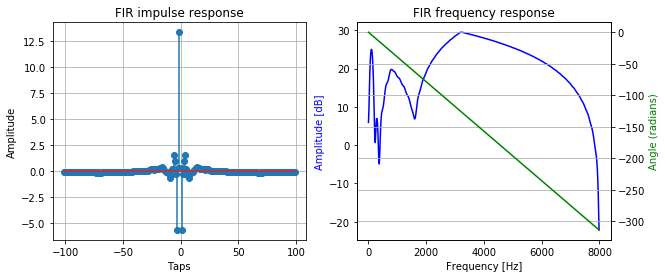

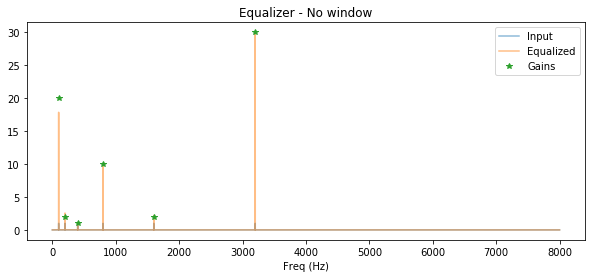

In [ ]:
def equalizer(s, gains):
    numtaps = 201
    freq = [0, 100, 200, 400, 800, 1600, 3200, 8000]
    gains = [0]+gains
    gains = gains+[0]
    eq = sgn.firwin2(numtaps, freq, gains, nyq = 8000, window=None)
    s_eq = sgn.convolve(s, eq, mode='same')
    return s_eq, eq

fs = 16000
t = np.arange(0, 2, 1/fs)
freq = [100, 200, 400, 800, 1600, 3200]
gains = [20, 2, 1, 10, 2, 30]
s = np.zeros(len(t))
for f in freq:
    s += np.sin(2*np.pi*f*t)

s_eq, eq = equalizer(s, gains)

plot_fir_response(eq, len(eq), fs)

fft_s = abs(np.fft.rfft(s))/(len(s)/2)
fft_s_eq = abs(np.fft.rfft(s_eq))/(len(s_eq)/2)
f = np.arange(0, len(fft_s))*(fs/(2*len(fft_s)))

plt.plot(f, fft_s, alpha=0.5)
plt.plot(f, fft_s_eq, alpha=0.5)
plt.plot(freq, gains, '*')
plt.legend(['Input', 'Equalized', 'Gains'])
plt.title('Equalizer - No window')
plt.xlabel('Freq (Hz)')
plt.show()